In [1]:
#pip install Quandl
#pip install yfinance
#pip install datapackage
#conda install py-xgboost

## Case study:

Step 1: Machine learning models for 100% better returns in Algo-trading:
https://medium.datadriveninvestor.com/machine-learning-models-for-market-beating-trading-strategies-c773ba46db66

Further work: Designing market-beating trading strategies utilizing ML models: 
https://medium.datadriveninvestor.com/designing-market-beating-trading-strategies-utilizing-ml-models-61b8256065dc

In [2]:
import pandas as pd
import yfinance as yf
import quandl
from datapackage import Package
import itertools
import matplotlib.pyplot as plt
import warnings
import pandas as pd
from sklearn import preprocessing
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import plot_importance
from matplotlib import pyplot
import random
import featexp as fexp
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split
import yfinance as yf
import functions as fct
%load_ext autoreload
%autoreload 2

pd.set_option('display.max_columns', None)

Quandl data limited only to data prior 2017 so using yfinance - closing prices for companies within __S&P500__

In [3]:
# Get tickers for S&P 500:
package = Package('https://datahub.io/core/s-and-p-500-companies/datapackage.json')

In [4]:
# print list of all resources:
print(package.resource_names)
companies = []
# print processed tabular data (if exists any)
for resource in package.resources:
    if resource.descriptor['datahub']['type'] == 'derived/csv':
        companies.append(resource.read())
        #print(resource.read())

['validation_report', 'constituents_csv', 'constituents_json', 's-and-p-500-companies_zip', 'constituents']


In [5]:
#flatten the list
companies_flat = list(itertools.chain(*companies))

#Get tickers:
tickers = []
for i in range(len(companies_flat)):
    tickers.append(companies_flat[i][0])
    
# Tickers into string
str1 = ' '.join(tickers)

In [6]:
# Save the list of companies to be able to reproduce the results in the future
#textfile = open("tickers_stocks.txt", "w")
#for element in tickers:
#    textfile.write(element + "\n")
#textfile.close()

In [7]:
#Limit date start="2016-01-01", end="2021-09-01"
data = yf.download(str1, start="2016-01-01", end="2021-09-01")#, group_by = 'ticker')
data = data['Adj Close']

[*********************100%***********************]  505 of 505 completed

2 Failed downloads:
- BRK.B: No data found, symbol may be delisted
- BF.B: None


In [8]:
##Save data
#data.to_csv('stock_price_master.csv')
data

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,AKAM,ALB,ALGN,ALK,ALL,ALLE,AMAT,AMCR,AMD,AME,AMGN,AMP,AMT,AMZN,ANET,ANSS,ANTM,AON,AOS,APA,APD,APH,APTV,ARE,ATO,ATVI,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBWI,BBY,BDX,BEN,BF.B,BIIB,BIO,BK,BKNG,BKR,BLK,BLL,BMY,BR,BRK.B,BRO,BSX,BWA,BXP,C,CAG,CAH,CARR,CAT,CB,CBOE,CBRE,CCI,CCL,CDAY,CDNS,CDW,CE,CERN,CF,CFG,CHD,CHRW,CHTR,CI,CINF,CL,CLX,CMA,CMCSA,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,COST,CPB,CPRT,CRL,CRM,CSCO,CSX,CTAS,CTLT,CTRA,CTSH,CTVA,CTXS,CVS,CVX,CZR,D,DAL,DD,DE,DFS,DG,DGX,DHI,DHR,DIS,DISCA,DISCK,DISH,DLR,DLTR,DOV,DOW,DPZ,DRE,DRI,DTE,DUK,DVA,DVN,DXC,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,ENPH,EOG,EQIX,EQR,ES,ESS,ETN,ETR,ETSY,EVRG,EW,EXC,EXPD,EXPE,EXR,F,FANG,FAST,FB,FBHS,FCX,FDX,FE,FFIV,FIS,FISV,FITB,FLT,FMC,FOX,FOXA,FRC,FRT,FTNT,FTV,GD,GE,GILD,GIS,GL,GLW,GM,GNRC,GOOG,GOOGL,GPC,GPN,GPS,GRMN,GS,GWW,HAL,HAS,HBAN,HBI,HCA,HD,HES,HIG,HII,HLT,HOLX,HON,HPE,HPQ,HRL,HSIC,HST,HSY,HUM,HWM,IBM,ICE,IDXX,IEX,IFF,ILMN,INCY,INFO,INTC,INTU,IP,IPG,IPGP,IQV,IR,IRM,ISRG,IT,ITW,IVZ,J,JBHT,JCI,JKHY,JNJ,JNPR,JPM,K,KEY,KEYS,KHC,KIM,KLAC,KMB,KMI,KMX,KO,KR,KSU,L,LDOS,LEG,LEN,LH,LHX,LIN,LKQ,LLY,LMT,LNC,LNT,LOW,LRCX,LUMN,LUV,LVS,LW,LYB,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MMM,MNST,MO,MOS,MPC,MPWR,MRK,MRNA,MRO,MS,MSCI,MSFT,MSI,MTB,MTCH,MTD,MU,NCLH,NDAQ,NEE,NEM,NFLX,NI,NKE,NLOK,NLSN,NOC,NOW,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,NWL,NWS,NWSA,NXPI,O,ODFL,OGN,OKE,OMC,ORCL,ORLY,OTIS,OXY,PAYC,PAYX,PBCT,PCAR,PEAK,PEG,PENN,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PKI,PLD,PM,PNC,PNR,PNW,POOL,PPG,PPL,PRU,PSA,PSX,PTC,PVH,PWR,PXD,PYPL,QCOM,QRVO,RCL,RE,REG,REGN,RF,RHI,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,RTX,SBAC,SBUX,SCHW,SEE,SHW,SIVB,SJM,SLB,SNA,SNPS,SO,SPG,SPGI,SRE,STE,STT,STX,STZ,SWK,SWKS,SYF,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TFC,TFX,TGT,TJX,TMO,TMUS,TPR,TRMB,TROW,TRV,TSCO,TSLA,TSN,TT,TTWO,TWTR,TXN,TXT,TYL,UA,UAA,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VFC,VIAC,VLO,VMC,VNO,VRSK,VRSN,VRTX,VTR,VTRS,VZ,WAB,WAT,WBA,WDC,WEC,WELL,WFC,WHR,WLTW,WM,WMB,WMT,WRB,WRK,WST,WU,WY,WYNN,XEL,XLNX,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [9]:
# Find columns where % of nulls > 40%
s = data.isnull().mean()*100>70
s[s == True].index

Index(['BF.B', 'BRK.B', 'CARR', 'OGN', 'OTIS'], dtype='object')

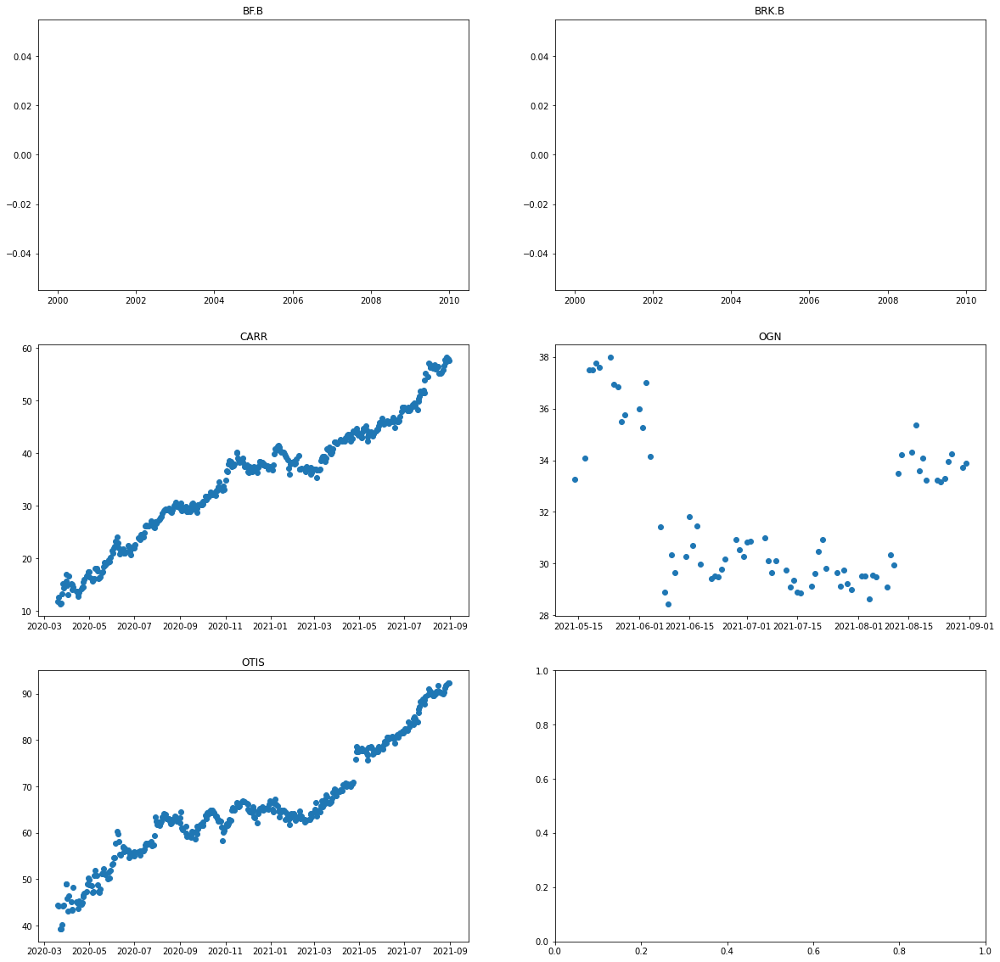

In [10]:
# Visualise the columns
warnings.filterwarnings("ignore")
columns = list(data.loc[:,s[s == True].index].columns)

fig, ax = plt.subplots(3, int(len(columns)/2), figsize = (20, 20))
ax = ax.flatten()
for idx, col in enumerate(columns, 0):
    ax[idx].plot(data.index, data[col], 'o')
    #ax[idx].set_xticklabels(rotation=45, labels = data.index)
    ax[idx].set_title(col)

plt.show()

In [11]:
# Drop the sparse columns
data_filtered = data.drop(columns, axis=1)
data_filtered

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACN,ADBE,ADI,ADM,ADP,ADSK,AEE,AEP,AES,AFL,AIG,AIZ,AJG,AKAM,ALB,ALGN,ALK,ALL,ALLE,AMAT,AMCR,AMD,AME,AMGN,AMP,AMT,AMZN,ANET,ANSS,ANTM,AON,AOS,APA,APD,APH,APTV,ARE,ATO,ATVI,AVB,AVGO,AVY,AWK,AXP,AZO,BA,BAC,BAX,BBWI,BBY,BDX,BEN,BIIB,BIO,BK,BKNG,BKR,BLK,BLL,BMY,BR,BRO,BSX,BWA,BXP,C,CAG,CAH,CAT,CB,CBOE,CBRE,CCI,CCL,CDAY,CDNS,CDW,CE,CERN,CF,CFG,CHD,CHRW,CHTR,CI,CINF,CL,CLX,CMA,CMCSA,CME,CMG,CMI,CMS,CNC,CNP,COF,COO,COP,COST,CPB,CPRT,CRL,CRM,CSCO,CSX,CTAS,CTLT,CTRA,CTSH,CTVA,CTXS,CVS,CVX,CZR,D,DAL,DD,DE,DFS,DG,DGX,DHI,DHR,DIS,DISCA,DISCK,DISH,DLR,DLTR,DOV,DOW,DPZ,DRE,DRI,DTE,DUK,DVA,DVN,DXC,DXCM,EA,EBAY,ECL,ED,EFX,EIX,EL,EMN,EMR,ENPH,EOG,EQIX,EQR,ES,ESS,ETN,ETR,ETSY,EVRG,EW,EXC,EXPD,EXPE,EXR,F,FANG,FAST,FB,FBHS,FCX,FDX,FE,FFIV,FIS,FISV,FITB,FLT,FMC,FOX,FOXA,FRC,FRT,FTNT,FTV,GD,GE,GILD,GIS,GL,GLW,GM,GNRC,GOOG,GOOGL,GPC,GPN,GPS,GRMN,GS,GWW,HAL,HAS,HBAN,HBI,HCA,HD,HES,HIG,HII,HLT,HOLX,HON,HPE,HPQ,HRL,HSIC,HST,HSY,HUM,HWM,IBM,ICE,IDXX,IEX,IFF,ILMN,INCY,INFO,INTC,INTU,IP,IPG,IPGP,IQV,IR,IRM,ISRG,IT,ITW,IVZ,J,JBHT,JCI,JKHY,JNJ,JNPR,JPM,K,KEY,KEYS,KHC,KIM,KLAC,KMB,KMI,KMX,KO,KR,KSU,L,LDOS,LEG,LEN,LH,LHX,LIN,LKQ,LLY,LMT,LNC,LNT,LOW,LRCX,LUMN,LUV,LVS,LW,LYB,LYV,MA,MAA,MAR,MAS,MCD,MCHP,MCK,MCO,MDLZ,MDT,MET,MGM,MHK,MKC,MKTX,MLM,MMC,MMM,MNST,MO,MOS,MPC,MPWR,MRK,MRNA,MRO,MS,MSCI,MSFT,MSI,MTB,MTCH,MTD,MU,NCLH,NDAQ,NEE,NEM,NFLX,NI,NKE,NLOK,NLSN,NOC,NOW,NRG,NSC,NTAP,NTRS,NUE,NVDA,NVR,NWL,NWS,NWSA,NXPI,O,ODFL,OKE,OMC,ORCL,ORLY,OXY,PAYC,PAYX,PBCT,PCAR,PEAK,PEG,PENN,PEP,PFE,PFG,PG,PGR,PH,PHM,PKG,PKI,PLD,PM,PNC,PNR,PNW,POOL,PPG,PPL,PRU,PSA,PSX,PTC,PVH,PWR,PXD,PYPL,QCOM,QRVO,RCL,RE,REG,REGN,RF,RHI,RJF,RL,RMD,ROK,ROL,ROP,ROST,RSG,RTX,SBAC,SBUX,SCHW,SEE,SHW,SIVB,SJM,SLB,SNA,SNPS,SO,SPG,SPGI,SRE,STE,STT,STX,STZ,SWK,SWKS,SYF,SYK,SYY,T,TAP,TDG,TDY,TECH,TEL,TER,TFC,TFX,TGT,TJX,TMO,TMUS,TPR,TRMB,TROW,TRV,TSCO,TSLA,TSN,TT,TTWO,TWTR,TXN,TXT,TYL,UA,UAA,UAL,UDR,UHS,ULTA,UNH,UNP,UPS,URI,USB,V,VFC,VIAC,VLO,VMC,VNO,VRSK,VRSN,VRTX,VTR,VTRS,VZ,WAB,WAT,WBA,WDC,WEC,WELL,WFC,WHR,WLTW,WM,WMB,WMT,WRB,WRK,WST,WU,WY,WYNN,XEL,XLNX,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

## Feature Engineering

### 1. The Relative Strength Index (RSI) 
It is a technical indicator that shows when a financial product is overbought or oversold and traders use this to determine when to enter or exit a position.

Application over 5, 10, 30, 60 days

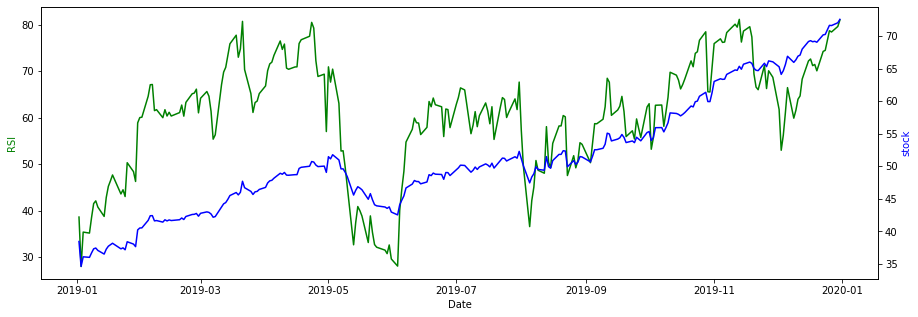

In [14]:
fct.RSI_visualise(after_start_date = '2019-01-01',
before_end_date = '2019-12-31',
data = data_filtered,
stock = 'AAPL',
period = 14)

Rule of thumb: RSI below 20 suggests an oversold condition and a reading above 80 suggests an overbought condition.

The values don't hold hre, but the overall trend corresponds with the price. What we see on the above example are the RSI dips that indicate price increase in the future e.g. June 2019 the stock was oversold as its RSI decreased meaning a signal to buy

In [17]:
#Create dictionaries for each stock for further appending (1 row for each stock each day)

features = {}

for f in data_filtered.columns:
    features[f] = {}
    features[f]['price'] = data[f]
    features[f]['RSI_5'] = fct.RSI(data[f], 5)
    features[f]['RSI_10'] = fct.RSI(data[f], 10)
    features[f]['RSI_30'] = fct.RSI(data[f], 30)
    features[f]['RSI_60'] = fct.RSI(data[f], 60)


In [18]:
pd.set_option('display.max_rows', 1000)
pd.DataFrame(features['AAPL']).head(100)

,price,RSI_5,RSI_10,RSI_30,RSI_60
Date,,,,,
2015-12-31,NaN,NaN,NaN,NaN,NaN
2016-01-04,24.323219,NaN,NaN,NaN,NaN
2016-01-05,23.713696,NaN,NaN,NaN,NaN
2016-01-06,23.249626,NaN,NaN,NaN,NaN
2016-01-07,22.268383,NaN,NaN,NaN,NaN
2016-01-08,22.386133,NaN,NaN,NaN,NaN
2016-01-11,22.748621,29.052356,NaN,NaN,NaN
2016-01-12,23.078775,43.805451,NaN,NaN,NaN
2016-01-13,22.485413,29.857469,NaN,NaN,NaN


### 2. Average daily/weekly/monthly returns over last 5, 10, 30, 60 days

In [19]:
for f in features:
    features[f]['mean_daily_r_5']  = features[f]['price'].pct_change(1).rolling(window=5).mean()
    features[f]['mean_daily_r_10'] = features[f]['price'].pct_change(1).rolling(window=10).mean()
    features[f]['mean_daily_r_30'] = features[f]['price'].pct_change(1).rolling(window=30).mean()
    features[f]['mean_daily_r_60'] = features[f]['price'].pct_change(1).rolling(window=60).mean()

### 3. Moving Average Convergence Divergence (MACD)

The Moving Average Convergence Divergence (MACD) is one of the most popular technical indicators used to generate signals among stock traders. This indicator serves as a momentum indicator that can help signal shifts in market momentum and help signal potential breakouts.

Moving average convergence divergence (MACD) is a trend-following momentum indicator that shows the relationship between two moving averages of a security’s price. 

MACD is calculated by subtracting the long-term EMA (e.g. 26 periods) from the short-term EMA (e.g. 12 periods). An exponential moving average (EMA) is a type of moving average (MA) that places a greater weight and significance on the most recent data points.

Computed for these pairs of periods: __[10, 30], [5, 10], [2, 10]__

In [20]:
for f in features:
    features[f]['macd_10_30'] = fct.macd(features[f]['price'], 30, 10) 
    features[f]['macd_5_10'] =  fct.macd(features[f]['price'], 10, 5)
    features[f]['macd_2_10'] =  fct.macd(features[f]['price'], 10, 2)


In [21]:
# Check the data
pd.DataFrame(features['A']).tail(10)

,price,RSI_5,RSI_10,RSI_30,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_5_10,macd_2_10
Date,,,,,,,,,,,,
2021-08-18,162.817261,85.193150,83.265945,73.934235,67.469039,0.008207,0.005555,0.002918,0.003411,4.898206,1.986678,3.524261
2021-08-19,167.461472,91.970917,88.521510,77.444834,69.646057,0.011829,0.007908,0.004016,0.003900,5.622361,2.668004,5.474119
2021-08-20,167.920914,92.401053,88.904546,77.751492,69.849052,0.011012,0.007757,0.003838,0.003938,6.164569,2.947551,5.565129
2021-08-23,169.788574,94.027011,90.357841,78.954733,70.660186,0.009669,0.008330,0.004325,0.003592,6.726342,3.204371,5.820921
2021-08-24,170.357880,94.477274,90.767419,79.307617,70.902841,0.011771,0.008678,0.004490,0.003576,7.144199,3.236509,5.461143
2021-08-25,173.084473,96.194620,92.469623,80.894805,72.029535,0.012350,0.010278,0.005166,0.003955,7.700058,3.471006,6.023050
2021-08-26,173.374115,96.345518,92.630005,81.054499,72.146050,0.006979,0.009404,0.005148,0.004060,8.069162,3.432435,5.586663
2021-08-27,173.593842,96.477955,92.759979,81.177965,72.235277,0.006684,0.008848,0.005197,0.004105,8.282795,3.236662,4.897011
2021-08-30,176.510208,97.800437,94.254314,82.723830,73.386019,0.007820,0.008744,0.006059,0.004198,8.691245,3.375589,5.529343


### 4. Change in MACD value with regards to previous day’s MACD value


In [22]:
for f in features:
    features[f]['macd_10_30_change'] = features[f]['macd_10_30'].diff(1) 
    features[f]['macd_5_10_change'] =  features[f]['macd_5_10'].diff(1) 
    features[f]['macd_2_10_change'] =  features[f]['macd_2_10'].diff(1) 

In [23]:
# Check the data
pd.DataFrame(features['AAPL']).tail(10)

,price,RSI_5,RSI_10,RSI_30,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_5_10,macd_2_10,macd_10_30_change,macd_5_10_change,macd_2_10_change
Date,,,,,,,,,,,,,,,
2021-08-18,146.360001,37.469134,47.755678,56.570728,56.215234,0.000815,-0.000334,0.000489,0.002420,2.637893,0.402490,-0.258491,-0.419247,-0.631393,-2.235966
2021-08-19,146.699997,40.556205,49.139036,56.934944,56.382787,-0.002875,-0.000177,0.000873,0.002485,2.325943,0.085215,-0.672121,-0.311951,-0.317275,-0.413630
2021-08-20,148.190002,53.210186,54.947784,58.512312,57.114191,-0.001125,0.001465,0.000776,0.002661,2.234674,0.132750,0.018967,-0.091269,0.047535,0.691088
2021-08-23,149.710007,63.199602,60.111476,60.056274,57.847486,-0.001784,0.002525,0.001259,0.003038,2.316904,0.380936,0.942118,0.082230,0.248186,0.923151
2021-08-24,149.619995,62.216367,59.661541,59.919670,57.787981,-0.000673,0.002800,0.000975,0.003117,2.342106,0.479585,1.036048,0.025202,0.098649,0.093930
2021-08-25,148.360001,48.903710,53.440147,58.008964,56.953983,0.002743,0.001779,-0.000109,0.003021,2.186122,0.313420,0.325178,-0.155984,-0.166165,-0.710871
2021-08-26,147.539993,41.653214,49.693045,56.789786,56.415129,0.001173,-0.000851,-0.000143,0.002824,1.944900,0.079545,-0.305691,-0.241222,-0.233874,-0.630869
2021-08-27,148.600006,52.929752,54.295963,57.971024,56.950565,0.000578,-0.000274,0.000566,0.003146,1.861798,0.107765,0.073253,-0.083102,0.028219,0.378944
2021-08-30,153.119995,76.814254,68.117167,62.493786,59.127893,0.004610,0.001413,0.002477,0.003336,2.306556,0.801473,2.359232,0.444758,0.693708,2.285979


### 5. Ratio of average close price over past m days with close price

In [24]:
for f in features:
    features[f]['price_ratio_2d'] = features[f]['price'].rolling(window=2).mean()/features[f]['price']
    features[f]['price_ratio_3d'] = features[f]['price'].rolling(window=3).mean()/features[f]['price']
    features[f]['price_ratio_4d'] = features[f]['price'].rolling(window=4).mean()/features[f]['price']
    features[f]['price_ratio_5d'] = features[f]['price'].rolling(window=5).mean()/features[f]['price']

In [25]:
# Check the data
pd.DataFrame(features['A']).tail(10)

,price,RSI_5,RSI_10,RSI_30,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_5_10,macd_2_10,macd_10_30_change,macd_5_10_change,macd_2_10_change,price_ratio_2d,price_ratio_3d,price_ratio_4d,price_ratio_5d
Date,,,,,,,,,,,,,,,,,,,
2021-08-18,162.817261,85.193150,83.265945,73.934235,67.469039,0.008207,0.005555,0.002918,0.003411,4.898206,1.986678,3.524261,0.309431,0.179780,0.459443,0.993528,0.993743,0.989495,0.985621
2021-08-19,167.461472,91.970917,88.521510,77.444834,69.646057,0.011829,0.007908,0.004016,0.003900,5.622361,2.668004,5.474119,0.724156,0.681326,1.949858,0.986133,0.977317,0.974638,0.969643
2021-08-20,167.920914,92.401053,88.904546,77.751492,69.849052,0.011012,0.007757,0.003838,0.003938,6.164569,2.947551,5.565129,0.542208,0.279547,0.091010,0.998632,0.988957,0.980982,0.977577
2021-08-23,169.788574,94.027011,90.357841,78.954733,70.660186,0.009669,0.008330,0.004325,0.003592,6.726342,3.204371,5.820921,0.561772,0.256820,0.255792,0.994500,0.991765,0.983559,0.976153
2021-08-24,170.357880,94.477274,90.767419,79.307617,70.902841,0.011771,0.008678,0.004490,0.003576,7.144199,3.236509,5.461143,0.417858,0.032138,-0.359778,0.998329,0.994118,0.991338,0.984218
2021-08-25,173.084473,96.194620,92.469623,80.894805,72.029535,0.012350,0.010278,0.005166,0.003955,7.700058,3.471006,6.023050,0.555859,0.234498,0.561907,0.992124,0.988402,0.983843,0.980577
2021-08-26,173.374115,96.345518,92.630005,81.054499,72.146050,0.006979,0.009404,0.005148,0.004060,8.069162,3.432435,5.586663,0.369104,-0.038571,-0.436387,0.999165,0.993644,0.990063,0.985760
2021-08-27,173.593842,96.477955,92.759979,81.177965,72.235277,0.006684,0.008848,0.005197,0.004105,8.282795,3.236662,4.897011,0.213632,-0.195773,-0.689652,0.999367,0.998600,0.994290,0.991048
2021-08-30,176.510208,97.800437,94.254314,82.723830,73.386019,0.007820,0.008744,0.006059,0.004198,8.691245,3.375589,5.529343,0.408450,0.138927,0.632332,0.991739,0.988570,0.986576,0.982289


#### Create Target Variable and choose the number of days according to how balanced the data is

1. Target: Did the price go up by more than 5% in the next __10 days__?
2. Target: Did the price go up by more than 5% in the next __7 days__?
3. Target: Did the price go up by more than 5% in the next __5 days__?

In [26]:
for f in features:
    features[f]['target_5d'] = features[f]['price'].pct_change(5)*100
    features[f]['target_5d_bool'] = features[f]['price'].pct_change(5)*100>=5
    #Percentage change is calculated over last 5 days so this needs to shift backwards
    features[f]['target_5d_bool'] =  features[f]['target_5d_bool'].shift(-5)
    features[f]['target_5d'] =  features[f]['target_5d'].shift(-5)
    
    features[f]['target_7d'] = features[f]['price'].pct_change(7)*100
    features[f]['target_7d_bool'] = features[f]['price'].pct_change(7)*100>=5
    #Percentage change is calculated over last 7 days so this needs to shift backwards
    features[f]['target_7d'] =  features[f]['target_7d'].shift(-7)
    features[f]['target_7d_bool'] =  features[f]['target_7d_bool'].shift(-7)
    
    features[f]['target_10d'] = features[f]['price'].pct_change(10)*100  
    features[f]['target_10d_bool'] = features[f]['price'].pct_change(10)*100>=5
    features[f]['target_10d'] =  features[f]['target_10d'].shift(-10)
    features[f]['target_10d_bool'] =  features[f]['target_10d_bool'].shift(-10)

In [27]:
#Add stock names in separate column for future reference
for f in features:
    features[f]['stock'] = f

In [28]:
# Check tail
pd.DataFrame(features['AAPL']).tail(10)

,price,RSI_5,RSI_10,RSI_30,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_5_10,macd_2_10,macd_10_30_change,macd_5_10_change,macd_2_10_change,price_ratio_2d,price_ratio_3d,price_ratio_4d,price_ratio_5d,target_5d,target_5d_bool,target_7d,target_7d_bool,target_10d,target_10d_bool,stock
Date,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-08-18,146.360001,37.469134,47.755678,56.570728,56.215234,0.000815,-0.000334,0.000489,0.002420,2.637893,0.402490,-0.258491,-0.419247,-0.631393,-2.235966,1.013084,1.019564,1.019353,1.018940,1.366494,False,1.530477,False,NaN,NaN,AAPL
2021-08-19,146.699997,40.556205,49.139036,56.934944,56.382787,-0.002875,-0.000177,0.000873,0.002485,2.325943,0.085215,-0.672121,-0.311951,-0.317275,-0.413630,0.998841,1.007157,1.012900,1.013592,0.572595,False,4.376277,False,NaN,NaN,AAPL
2021-08-20,148.190002,53.210186,54.947784,58.512312,57.114191,-0.001125,0.001465,0.000776,0.002661,2.234674,0.132750,0.018967,-0.091269,0.047535,0.691088,0.994973,0.992532,0.997773,1.002173,0.276674,False,2.456306,False,NaN,NaN,AAPL
2021-08-23,149.710007,63.199602,60.111476,60.056274,57.847486,-0.001784,0.002525,0.001259,0.003038,2.316904,0.380936,0.942118,0.082230,0.248186,0.923151,0.994924,0.989914,0.986841,0.990114,2.277729,False,NaN,NaN,NaN,NaN,AAPL
2021-08-24,149.619995,62.216367,59.661541,59.919670,57.787981,-0.000673,0.002800,0.000975,0.003117,2.342106,0.479585,1.036048,0.025202,0.098649,0.093930,1.000301,0.997015,0.992882,0.989948,1.477080,False,NaN,NaN,NaN,NaN,AAPL
2021-08-25,148.360001,48.903710,53.440147,58.008964,56.953983,0.002743,0.001779,-0.000109,0.003021,2.186122,0.313420,0.325178,-0.155984,-0.166165,-0.710871,1.004246,1.005864,1.004112,1.001051,NaN,NaN,NaN,NaN,NaN,NaN,AAPL
2021-08-26,147.539993,41.653214,49.693045,56.789786,56.415129,0.001173,-0.000851,-0.000143,0.002824,1.944900,0.079545,-0.305691,-0.241222,-0.233874,-0.630869,1.002779,1.006552,1.008591,1.007754,NaN,NaN,NaN,NaN,NaN,NaN,AAPL
2021-08-27,148.600006,52.929752,54.295963,57.971024,56.950565,0.000578,-0.000274,0.000566,0.003146,1.861798,0.107765,0.073253,-0.083102,0.028219,0.378944,0.996433,0.997084,0.999529,1.001117,NaN,NaN,NaN,NaN,NaN,NaN,AAPL
2021-08-30,153.119995,76.814254,68.117167,62.493786,59.127893,0.004610,0.001413,0.002477,0.003336,2.306556,0.801473,2.359232,0.444758,0.693708,2.285979,0.985240,0.978013,0.975738,0.976019,NaN,NaN,NaN,NaN,NaN,NaN,AAPL


In [29]:
frames = []
for f in features:
    frames.append(pd.DataFrame(features[f]))
    
result = pd.concat(frames)
#result

#Droping NAN rows (out of 682,500 rows we are left with 633,278)
result.dropna(inplace=True)

#Compare balance of the data for 3 prediction periods:
print("Target: Did the price go up by more than 5% in the next 5 days?")
print(result['target_5d_bool'].value_counts(normalize=True))

print("Target: Did the price go up by more than 5% in the next 7 days?")
print(result['target_7d_bool'].value_counts(normalize=True))

print("Target: Did the price go up by more than 5% in the next 10 days?")
print(result['target_10d_bool'].value_counts(normalize=True))

Target: Did the price go up by more than 5% in the next 5 days?
False    0.906601
True     0.093399
Name: target_5d_bool, dtype: float64
Target: Did the price go up by more than 5% in the next 7 days?
False    0.869877
True     0.130123
Name: target_7d_bool, dtype: float64
Target: Did the price go up by more than 5% in the next 10 days?
False    0.821625
True     0.178375
Name: target_10d_bool, dtype: float64


__Based on the data balance for the above target 10 days span was chosen__

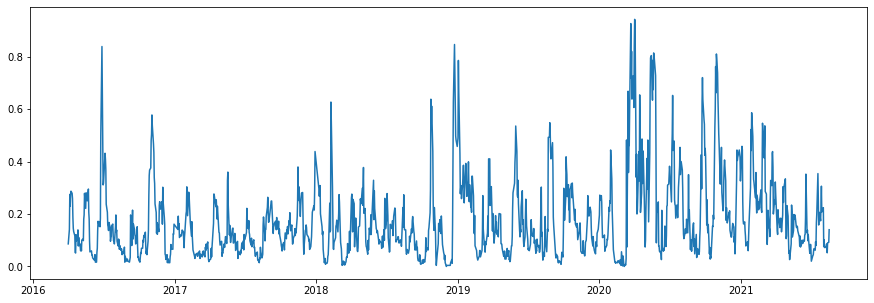

In [30]:
# Check if target distributed evenly accross time:
test = pd.DataFrame(result.groupby(level=0)['target_10d_bool'].sum()/result.groupby(level=0)['target_10d_bool'].count())

plt.figure(figsize=(15,5))
plt.plot(test.index, test['target_10d_bool'])

In [31]:
#Change boolean to integer
result['target_10d_int'] = result['target_10d_bool'].astype(int)

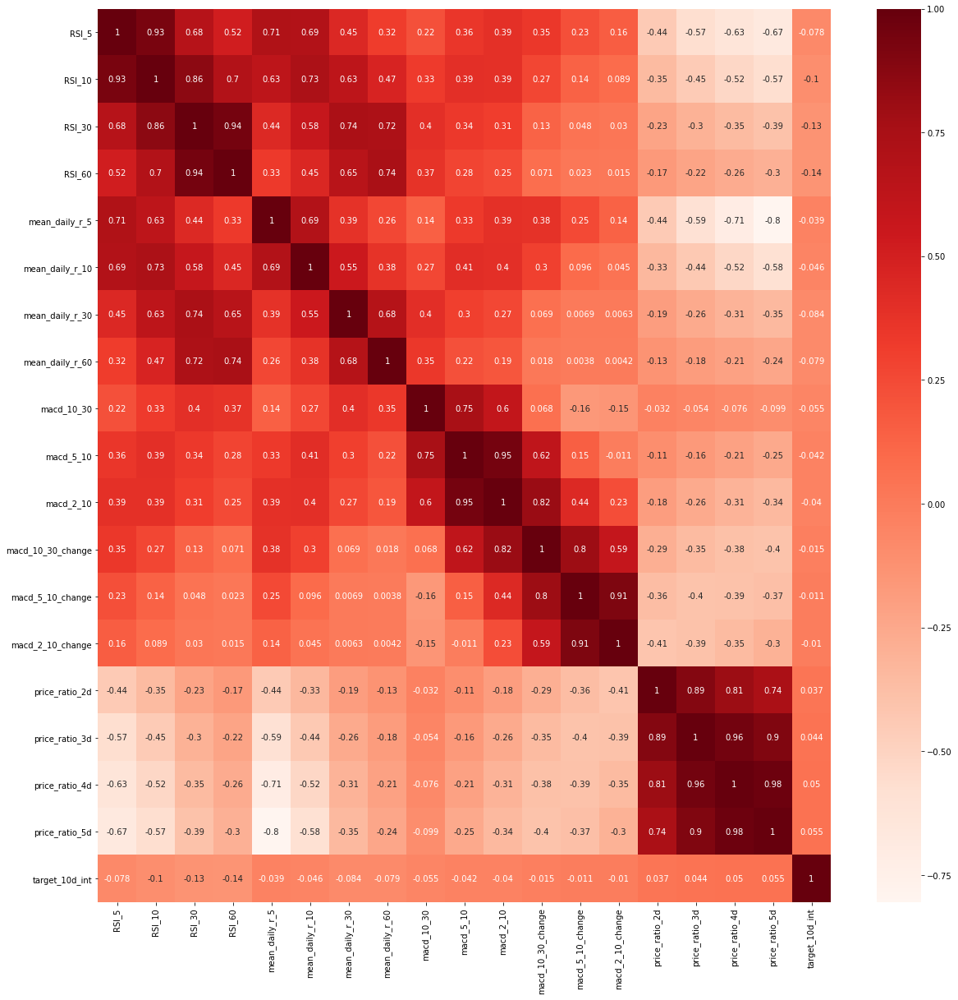

In [32]:
# Create correlation matrix
plt.figure(figsize=(20,20))
cor = result[['RSI_5', 'RSI_10', 'RSI_30', 'RSI_60', 'mean_daily_r_5',
       'mean_daily_r_10', 'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30',
       'macd_5_10', 'macd_2_10', 'macd_10_30_change', 'macd_5_10_change',
       'macd_2_10_change', 'price_ratio_2d', 'price_ratio_3d',
       'price_ratio_4d', 'price_ratio_5d','target_10d_int']].corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [33]:
#Drop highly correlated vars (-0.9>correlation>0.9)
result.drop(labels={
 'RSI_5',
 'RSI_10',
 'RSI_30',
 'macd_5_10',
 'macd_2_10_change',
 'price_ratio_3d',
 'price_ratio_4d'}, axis=1, inplace=True) #

result.columns

Index(['price', 'RSI_60', 'mean_daily_r_5', 'mean_daily_r_10',
       'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30', 'macd_2_10',
       'macd_10_30_change', 'macd_5_10_change', 'price_ratio_2d',
       'price_ratio_5d', 'target_5d', 'target_5d_bool', 'target_7d',
       'target_7d_bool', 'target_10d', 'target_10d_bool', 'stock',
       'target_10d_int'],
      dtype='object')

In [34]:
#result = result.reset_index().reset_index()
#result = result.drop(['Date'], axis=1)
#result

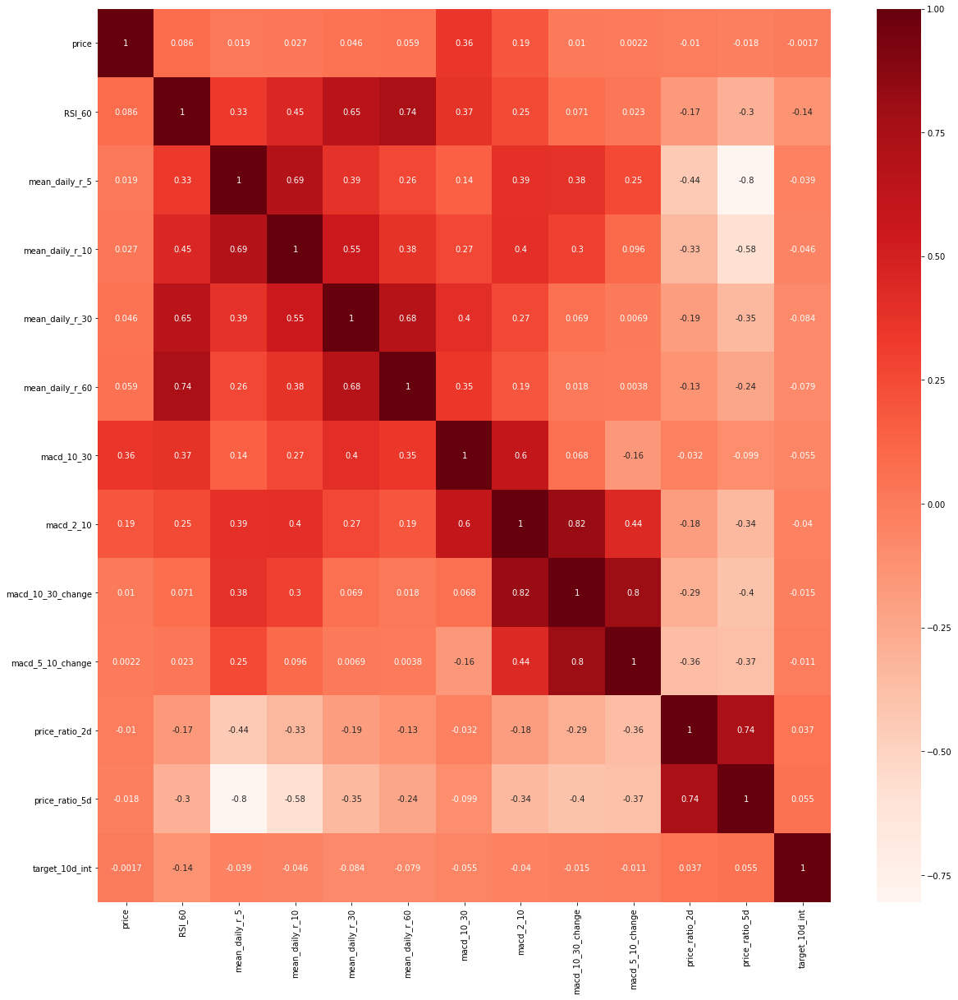

In [35]:
# Create correlation matrix after dropping highly correlated variables (-0.9>correlation>0.9)
df_uncorrelated = pd.DataFrame(result[['price', 'RSI_60', 'mean_daily_r_5', 'mean_daily_r_10',
       'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30', 'macd_2_10','macd_10_30_change',
       'macd_5_10_change', 'price_ratio_2d','price_ratio_5d','target_10d_int']])

plt.figure(figsize=(20,20))
cor = df_uncorrelated.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

### Create validation data

In [36]:
# Validation dataset from 1st of April 2021
Validation = df_uncorrelated[df_uncorrelated[['RSI_60', 'mean_daily_r_5', 'mean_daily_r_10',
       'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30', 'macd_2_10',
       'macd_10_30_change', 'macd_5_10_change', 'price_ratio_2d',
       'price_ratio_5d','target_10d_int']].index>='2021-04-01']

print(Validation.shape)
#df['price_change_rate_5d'] = df['price'].pct_change(10)*100

#Reset index
df_2 = df_uncorrelated.reset_index().reset_index().drop(['index'], axis=1)
df_2

(48000, 13)


,Date,price,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_2_10,macd_10_30_change,macd_5_10_change,price_ratio_2d,price_ratio_5d,target_10d_int
0,2016-04-01,38.464615,53.323483,0.005044,0.002920,0.002891,0.000036,0.715590,0.439051,0.042550,0.047695,0.992868,0.989825,0
1,2016-04-04,38.178341,52.484985,0.003099,-0.000115,0.002419,0.000620,0.706183,0.298294,-0.009407,-0.031769,1.003749,1.000267,0
2,2016-04-05,37.462681,50.467460,-0.003888,-0.000646,0.001269,0.000483,0.606751,-0.123238,-0.099432,-0.138246,1.009552,1.015381,1
3,2016-04-06,38.397816,52.874623,0.001303,0.001270,0.002855,0.001180,0.633222,0.230135,0.026471,0.062175,0.987823,0.991824,0
4,2016-04-07,37.663055,50.898164,-0.001178,0.000385,0.001939,0.000751,0.559867,-0.057633,-0.073356,-0.085287,1.009754,1.009830,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665291,2021-08-11,197.410004,58.655875,-0.007310,-0.002901,0.001716,0.002534,2.965208,-2.668314,-0.715052,-0.420951,1.003419,1.014751,0
665292,2021-08-12,199.839996,59.691718,-0.003921,-0.002088,0.002416,0.002755,2.668171,-1.326469,-0.297037,0.199714,0.993920,0.998409,0
665293,2021-08-13,201.479996,60.373127,-0.000356,-0.000572,0.002165,0.002777,2.601898,-0.004575,-0.066274,0.406459,0.995930,0.989885,0
665294,2021-08-16,204.779999,61.698091,0.005059,0.001357,0.002111,0.002610,2.907748,1.956497,0.305851,0.746110,0.991943,0.978875,0


### Create training data

In [37]:
# Training dataset until 1st of April 2021
Training_data = df_2[df_2[['Date','RSI_60', 'mean_daily_r_5', 'mean_daily_r_10',
       'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30', 'macd_2_10',
       'macd_10_30_change', 'macd_5_10_change', 'price_ratio_2d',
       'price_ratio_5d','target_10d_int']]['Date']<'2021-04-01']

Training_data = Training_data.drop(['Date'], axis=1)

print(Training_data.shape)
Training_data.tail()

(617296, 13)


,price,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_2_10,macd_10_30_change,macd_5_10_change,price_ratio_2d,price_ratio_5d,target_10d_int
665195,152.459732,48.056942,0.000661,0.000413,-0.001469,-0.000847,-1.150336,-0.308529,-0.101404,-0.446424,1.008340,1.011381,0
665196,155.720734,49.552878,0.004020,0.002414,-0.001549,-0.000566,-0.831934,0.906461,0.318402,0.236183,0.989529,0.994083,0
665197,157.954590,50.545076,0.003611,0.002361,-0.001531,-0.000444,-0.316436,2.211030,0.515498,0.438571,0.992929,0.983509,0
665198,156.608276,49.943033,0.001379,0.001386,-0.001737,-0.000711,-0.076089,1.646060,0.240347,-0.020065,1.004298,0.993237,0
665199,157.047073,50.139876,0.002721,0.000930,-0.002161,-0.000472,0.160235,1.505205,0.236325,0.001457,0.998603,0.993066,1


### Split data into train vs test


In [38]:
#Set seed
random.seed(1)
#Include stratification and set test size to 33%
X_train, X_test, y_train, y_test = train_test_split(Training_data[['RSI_60', 'mean_daily_r_5', 'mean_daily_r_10',
       'mean_daily_r_30', 'mean_daily_r_60', 'macd_10_30', 'macd_2_10',
       'macd_10_30_change', 'macd_5_10_change', 'price_ratio_2d','price_ratio_5d']], 
        Training_data['target_10d_int'], test_size=0.33, stratify=Training_data['target_10d_int'])


In [39]:
#Create a classifier model (with default parameters for now)
random.seed(10)
model = XGBClassifier()
#Fit th model
model.fit(X_train, y_train)
# make predictions for test data
y_pred = model.predict(X_test)
y_pred_proba_test = model.predict_proba(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[20:47:41] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 82.43%


In [40]:
# precision tp / (tp + fp)
precision = precision_score(y_test, predictions)
print('Precision: %f' % precision)
## recall: tp / (tp + fn)
#recall = recall_score(y_test, predictions)
#print('Recall: %f' % recall)
## f1: 2 tp / (2 tp + fp + fn)
#f1 = f1_score(y_test, predictions)
#print('F1 score: %f' % f1)

Precision: 0.613191


                                           Plots for RSI_60                                           
                                           Train data plots                                           


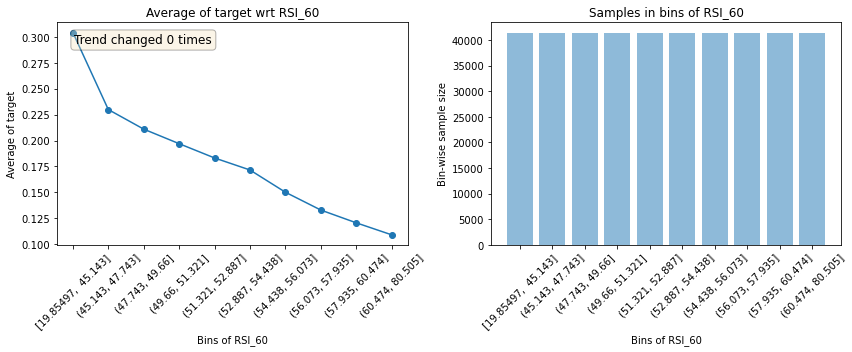

                                           Test data plots                                            


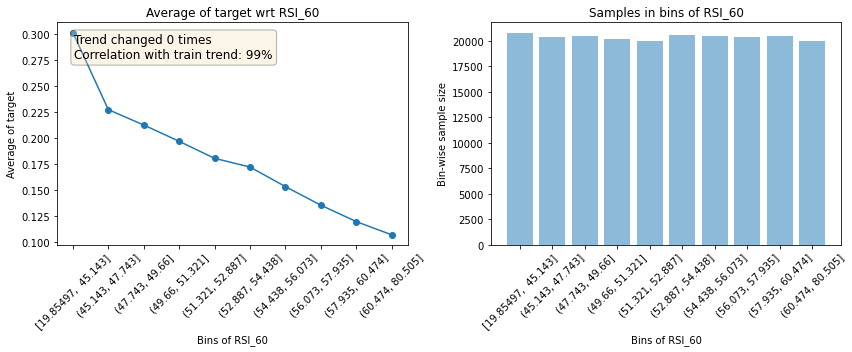

--------------------------------------------------------------------------------------------------------------


                                       Plots for mean_daily_r_5                                       
                                           Train data plots                                           


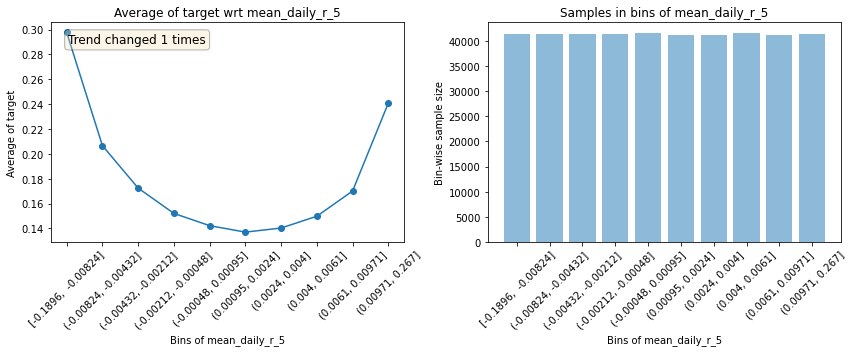

                                           Test data plots                                            


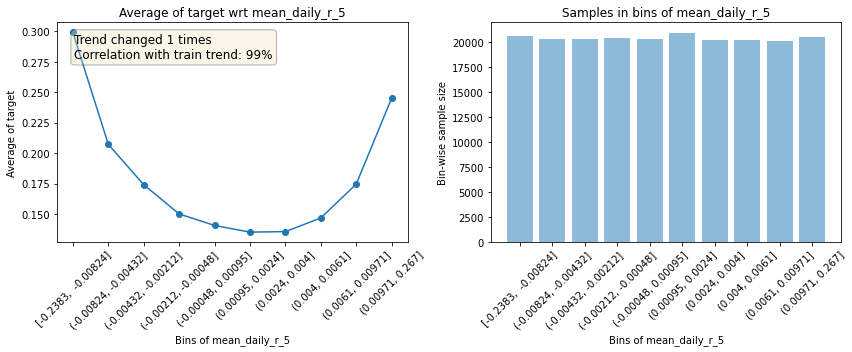

--------------------------------------------------------------------------------------------------------------


                                      Plots for mean_daily_r_10                                       
                                           Train data plots                                           


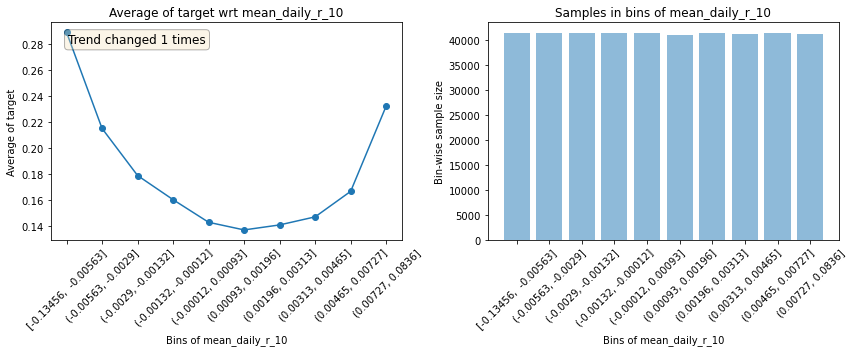

                                           Test data plots                                            


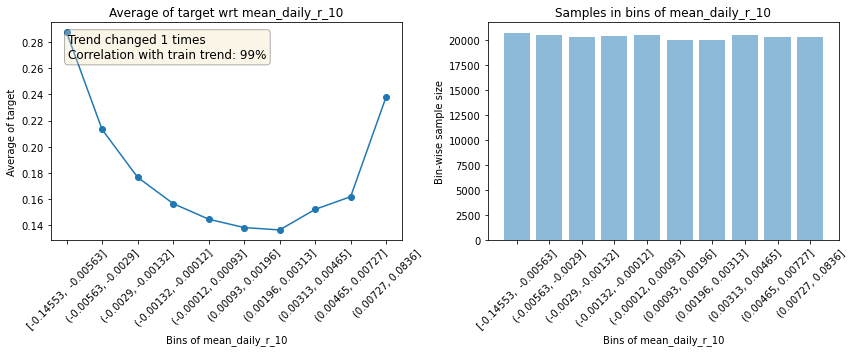

--------------------------------------------------------------------------------------------------------------


                                      Plots for mean_daily_r_30                                       
                                           Train data plots                                           


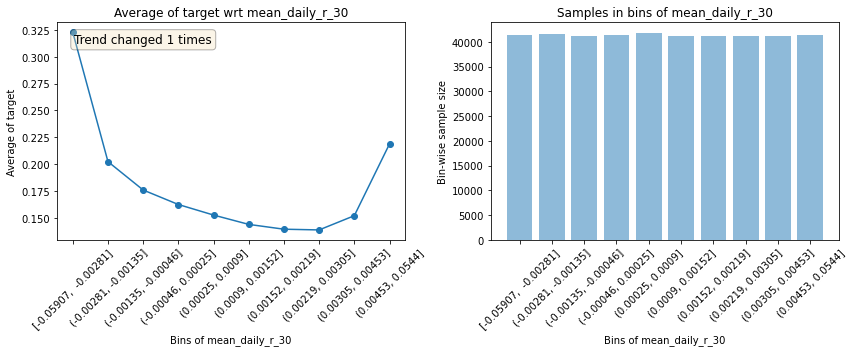

                                           Test data plots                                            


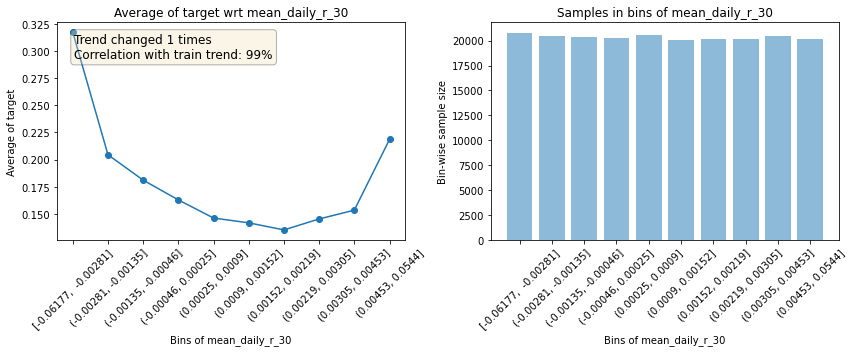

--------------------------------------------------------------------------------------------------------------


                                      Plots for mean_daily_r_60                                       
                                           Train data plots                                           


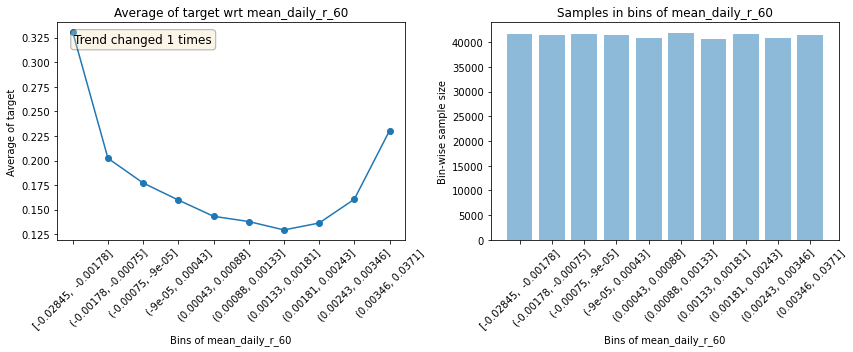

                                           Test data plots                                            


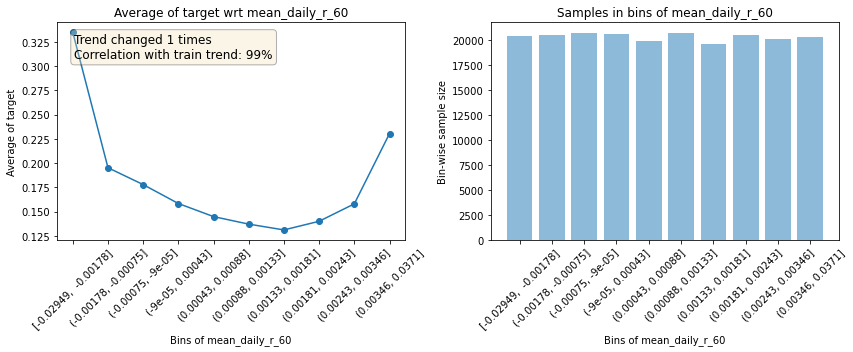

--------------------------------------------------------------------------------------------------------------


                                         Plots for macd_10_30                                         
                                           Train data plots                                           


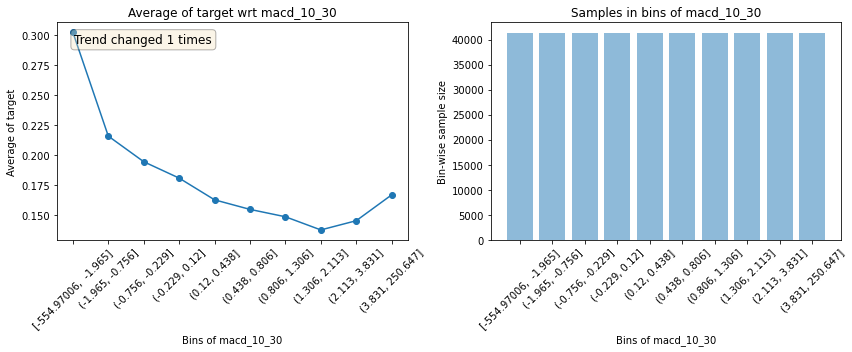

                                           Test data plots                                            


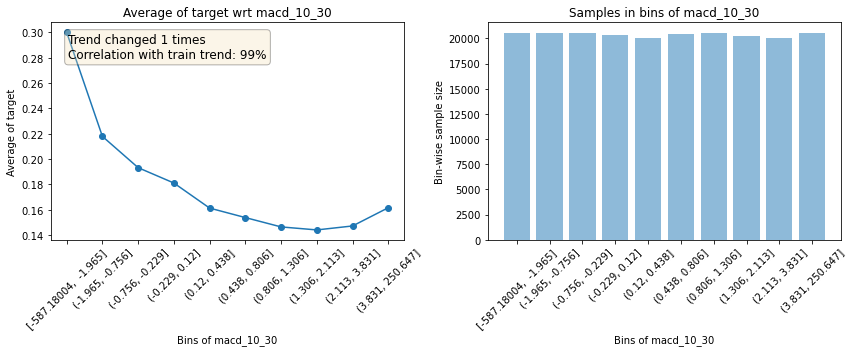

--------------------------------------------------------------------------------------------------------------


                                         Plots for macd_2_10                                          
                                           Train data plots                                           


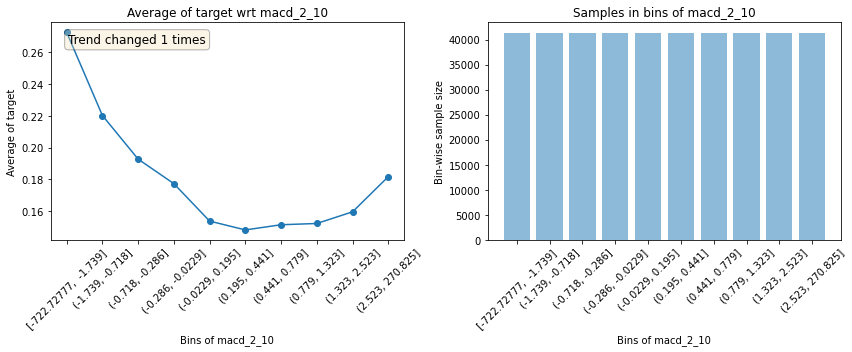

                                           Test data plots                                            


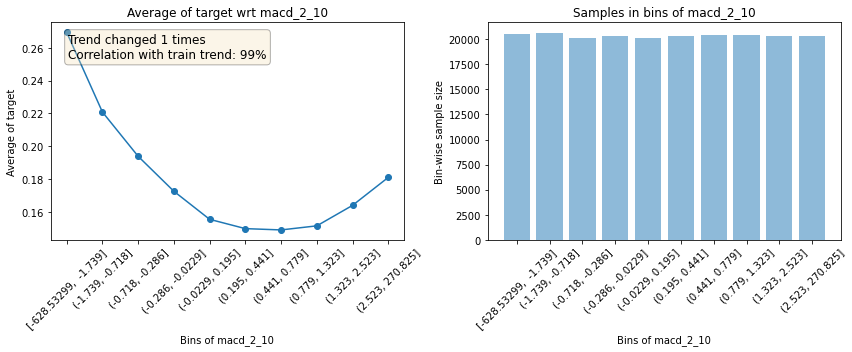

--------------------------------------------------------------------------------------------------------------


                                     Plots for macd_10_30_change                                      
                                           Train data plots                                           


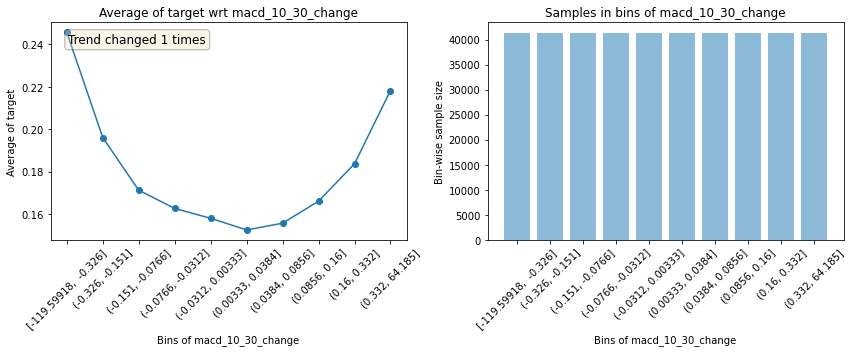

                                           Test data plots                                            


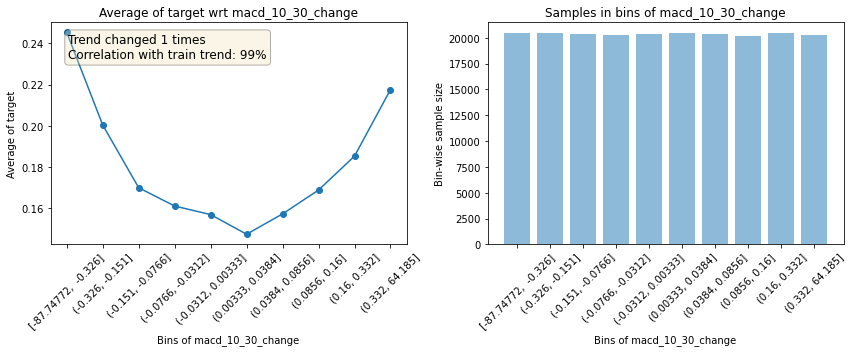

--------------------------------------------------------------------------------------------------------------


                                      Plots for macd_5_10_change                                      
                                           Train data plots                                           


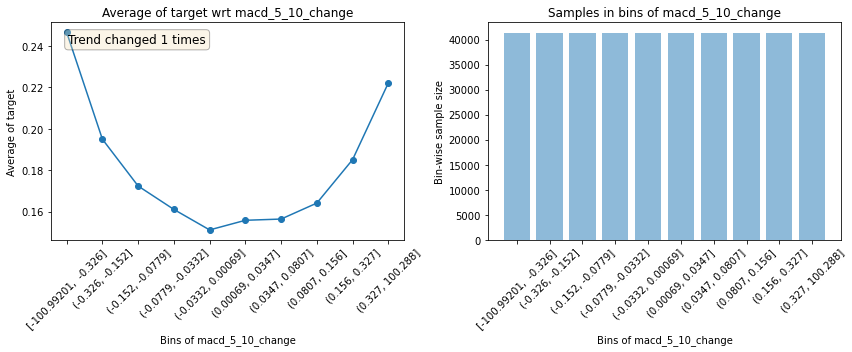

                                           Test data plots                                            


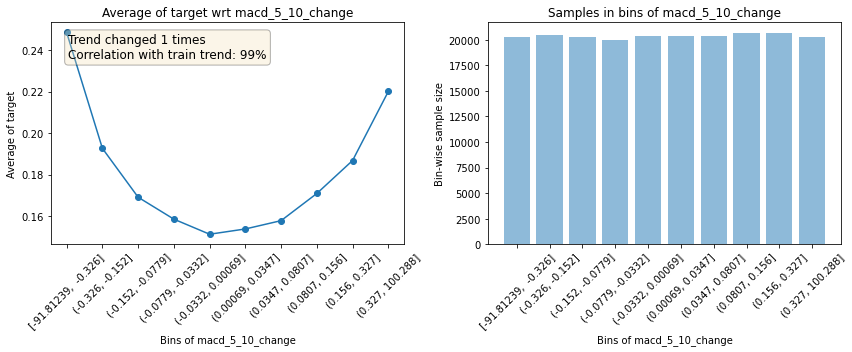

--------------------------------------------------------------------------------------------------------------


                                       Plots for price_ratio_2d                                       
                                           Train data plots                                           


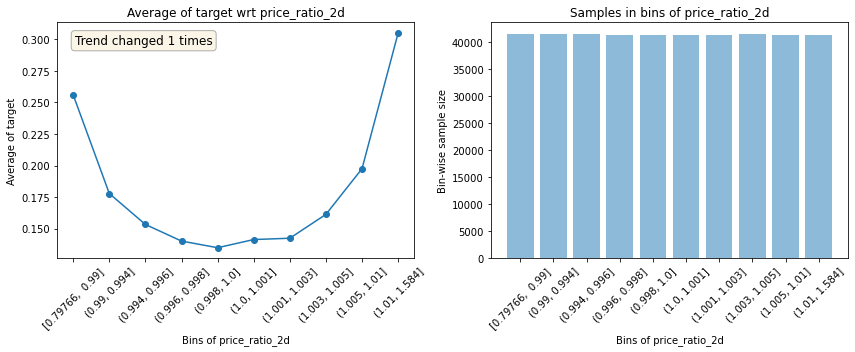

                                           Test data plots                                            


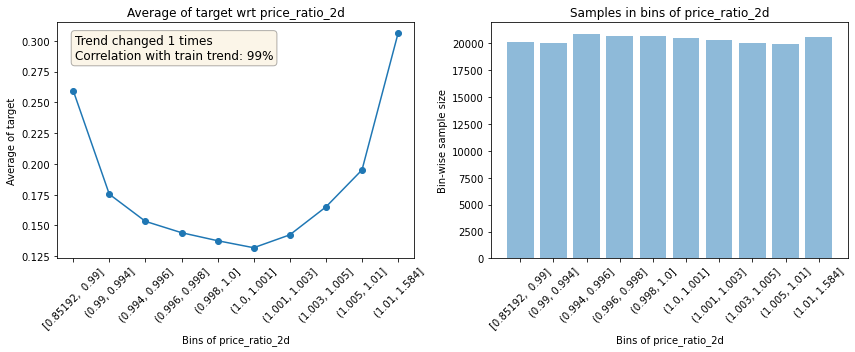

--------------------------------------------------------------------------------------------------------------


                                       Plots for price_ratio_5d                                       
                                           Train data plots                                           


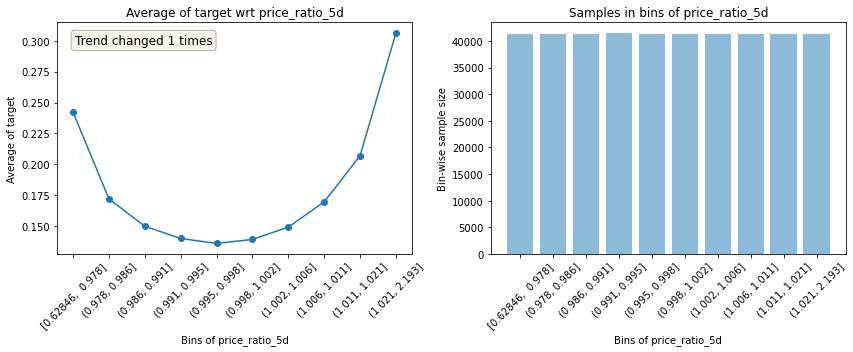

                                           Test data plots                                            


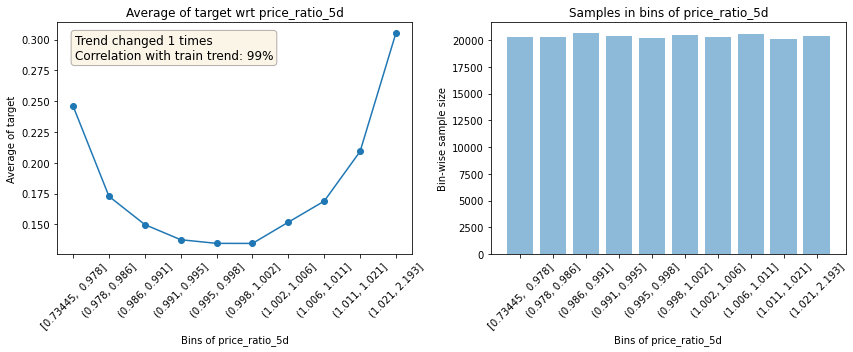

--------------------------------------------------------------------------------------------------------------




In [41]:
#Show features
data_train = X_train
data_train['target'] = y_train

data_test = X_test
data_test['target'] = y_test

# plots univariate plots of first 15 columns in data_train
fexp.get_univariate_plots(data=data_train, target_col='target', features_list=data_train.columns[0:15], data_test=data_test)

- Patterns for train and test are relatively similar for the above features


Features:

- __RSI__ has a reverse relationship against the target (as expected): 
    - __Low RSI__ indicates an oversold product and its lowering price with a potential to increase (hence the model predicts to buy)
    - __High RSI__ reflects the overbought assets (with price going towards the peak) for which the proportion of target = 1 is the lowest (the model doesn't believe the price will go up)
-  __Mean daily return for the last n consecutive days__ indicates that the proportion of trades that model considers as profitable is highest among the lowest and the highest returns (corresponding to oversold stock for lowest returns and upwards trend for the price when the average of returns from the last 5 days returns are the highest)
    - Stocks that have recently gone down or up a lot are more likely to go up in next 10 days
- __MACD for 10 vs. 30 days__ - A positive MACD value, created when the short-term average is above the longer-term average, is used to signal increasing upward momentum, while the negative MACD values suggest that the downtrend is getting stronger. It again suggests that stocks that have recently gone down or up a lot are more likely to go up in next 10 days, however the relationship is weaker for the stocks which price went up a lot. 
    - From the plots visualising stock time-series to see where the model gives high probability of going up we can clearly see the model is biased and returns the highest probabilities for stocks that have been of a steep/lengthy downward slope
- __Change od MACD values__ looks more polarised to its pure form (e.g. MACD 10 30). If the MACD is higher tomorrow then it is a signal for an increasing upward momentum (the higher the difference the more likely for the price to go up) while negative values indicate stock downward trend is weaker, hence also a signal to buy
    



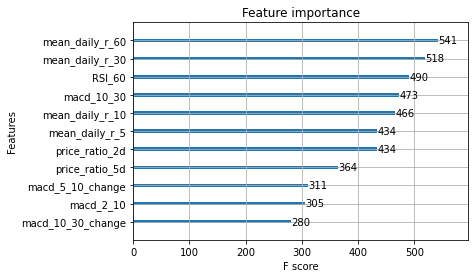

In [42]:
# Plot feature importance from the model
plot_importance(model)
pyplot.show()

### Calculate predictions for Validation data

In [43]:
# Calculate predictions for validation data
# Include only non-leaky features
Validation_clean = Validation[['RSI_60', 'mean_daily_r_5', 'mean_daily_r_10', 'mean_daily_r_30',
       'mean_daily_r_60', 'macd_10_30', 'macd_2_10', 'macd_10_30_change',
       'macd_5_10_change', 'price_ratio_2d', 'price_ratio_5d']]

# make predictions for validation data
y_pred_val = model.predict(Validation_clean)
y_pred_proba = model.predict_proba(Validation_clean)
predictions_val = [round(value) for value in y_pred_val]

# evaluate predictions
accuracy = accuracy_score(Validation['target_10d_int'], predictions_val)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 84.91%


### Calculate average return for trades that the algorithm predicted to bring >= 5% return for Validation data

In [44]:
# Enhance validation dataset (add y_pred and include the right time span)
Validation_clean['y_pred'] = y_pred_val
# Join prebabilities to the validation dataset
Validation_clean['y_pred_proba'] = y_pred_proba[:,1]

#Include stock and price post 1st of April 2021
Validation_clean['stock'] = result.loc[result.index>='2021-04-01',:]['stock']
Validation_clean['price'] = result.loc[result.index>='2021-04-01',:]['price']
#Add percentage difference in returns:
Validation_clean['price_change_rate_1d'] = Validation_clean.groupby(by="stock", dropna=False)[['stock','price']].pct_change()*100

In [45]:
#Reset index for unique indices
Validation_clean_reset = Validation_clean.reset_index()
#Create a list of indices for the predictions = 1 (that trade will bring >=5% within the next 10 days)
idx_targets_positive = Validation_clean_reset[Validation_clean_reset['y_pred']==1].index

In [46]:
#Create column including trade returns
Validation_clean_reset['trade returns'] = np.nan 

#### Logic: 
Trade is realised once the trigger of 5% has been crossed or at day 10th. That means that sale of the stock happens within two scenarios:
- Once the cummulative return from the time of buying hits 5% (up to 10 days)
- At day 10 for stocks which cumulative return doesnt hit 5%

In [47]:
fct.average_trade_returns(indicex_of_positive_predictions = idx_targets_positive, data = Validation_clean_reset)

Median percentage return: 3.03%
Mean percentage return: 2.91%


In [48]:
#See histogram of returns
fig = px.histogram(Validation_clean_reset, x="trade returns", range_x = [-10,20], nbins = 50)
fig.show()

### Calculate average return for trades that the algorithm predicted to bring >= 5% return for Test data

In [49]:
#Add y predictions
X_test['y_pred'] = y_pred
X_train['y_pred'] = np.nan

result_reset = result.reset_index()

#Concatenate test and train data (this is because the data was shuffled before splitting into test and train), 
#hence the returns wont be able to be calculated as the test data contains gaps
X_test_X_train = pd.concat([X_test, X_train])

#Add date, stock and price
X_test_stock_price = X_test_X_train.merge(result_reset[['Date','stock', 'price']], how='left', left_index=True, right_index=True)
X_test_stock_price =  X_test_stock_price.sort_values(['stock','Date']).reset_index()
#Add percentage difference in returns:
X_test_stock_price['price_change_rate_1d'] = X_test_stock_price.groupby(by="stock", dropna=False)[['stock','price']].pct_change()*100
#Create a list of indices for the predictions = 1 (that trade will bring >=5% within the next 10 days)
idx_targets_positive = X_test_stock_price[X_test_stock_price['y_pred']==1].index


In [50]:
#Check
X_test_stock_price[X_test_stock_price['y_pred']==1].head(3)

,index,RSI_60,mean_daily_r_5,mean_daily_r_10,mean_daily_r_30,mean_daily_r_60,macd_10_30,macd_2_10,macd_10_30_change,macd_5_10_change,price_ratio_2d,price_ratio_5d,target,y_pred,Date,stock,price,price_change_rate_1d
681,681,49.542556,0.010255,-0.002721,0.000732,-0.000849,-0.955823,-0.216482,-0.029589,-0.030752,1.013472,1.007168,1,1.0,2019-01-02,A,64.346909,-2.623788
976,976,49.584200,0.008571,-0.004054,-0.003501,-0.000164,-1.642315,0.109821,0.001028,-0.151698,1.024173,1.004648,0,1.0,2020-03-05,A,79.487701,-4.611731
988,988,41.516528,-0.000980,-0.009105,-0.008011,-0.004357,-6.370016,-3.707186,-0.290264,-0.249175,1.024381,1.056967,1,1.0,2020-03-23,A,62.604221,-4.649405


In [51]:
# Calculate Median and mean return for the realised trades
fct.average_trade_returns(indicex_of_positive_predictions = idx_targets_positive, data = X_test_stock_price)

Median percentage return: 6.65%
Mean percentage return: 6.78%


In [52]:
#Check for Minimum and Maximum returns
print("Minimum percentage return: %.2f%%" % (X_test_stock_price['trade returns'].min()))
print("Maximum percentage return: %.2f%%" % (X_test_stock_price['trade returns'].max()))

Minimum percentage return: -44.80%
Maximum percentage return: 48.12%


In [53]:
#Show histogram of returns
fig = px.histogram(X_test_stock_price, x="trade returns", range_x = [-20,30], nbins = 100)
fig.show()

Non-Gaussian distribution. In both histograms (validation and training data) we see a step change in returns for positive returns, but no similar trend for negative returns. Might reflect the type of assets included in S&P500 (less vulnerable/more risk proof).

#### Look at price time-series and see where the model gives high probability of going up (based on validation data)

In [54]:
# Plot y_pred (colour heated) for a chosen company
df = Validation_clean_reset[Validation_clean_reset['stock'].isin(['AAL'])]
fig = px.scatter(df, x="Date", 
                 y="price", 
                 color="y_pred_proba", 
                 color_continuous_scale='Bluered', 
                 range_color=(0,1),
                 size='y_pred_proba',
                 size_max=10)
fig.show()

In the above plot showing stocks of __American Airlines Group__ there is an agglomeration of high probabilites around the end of April which is correctly predicting an increase of price in May. 

This specific example suggest to include a higher time span for the price increase (>10 days as this is when the price increases most - hence biggest possible gains). This would require refinement of the hypothesis and retraining of the algorithm.

In [55]:
# Plot y_pred (colour heated) for a chosen company
df = Validation_clean_reset[Validation_clean_reset['stock'].isin(['AIG'])]
fig = px.scatter(df, x="Date", 
                 y="price", 
                 color="y_pred_proba", 
                 color_continuous_scale='Bluered',
                 range_color=(0,1),
                 size='y_pred_proba',
                 size_max=10)
fig.show()

None of the above probabilites reached more than 0.5, but agglomeration of higher probabilities is also correctly identified (mid July). This suggests that lowering the threshold might also be an option for better performance.





Execute your trading algos commission-free
Buy, sell, and short U.S. stocks with zero commissions.
Plus, business and personal accounts are both supported. Alpaca Securities LLC is a FINRA-registered broker-dealer designed for high volume trading.

https://alpaca.markets/algotrading